In [1432]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import optimize
import scipy.optimize
#from scipy.ndimage import gaussian_filter1d
import sys

import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable

import qgm
from qgm import image, parameter, filter, data, fitting, function

from regions import PixCoord, RectanglePixelRegion, CirclePixelRegion

cmap = image.generate_cmap(['#330000', 'r', 'w'])

# Contrast in Spiral 2

In [1433]:
date = '20230201'
dataNo = 1
scanNo = 1

In [1434]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [1435]:
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

columns_sweep

['Total count @ ROI1 (arb. u.)', 'T0049: LS ramp up time 1st (usec.)']

In [1436]:
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 6
sample3 = 12
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [1437]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1438]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

Text(0.5, 1.0, '240.0[ms]')

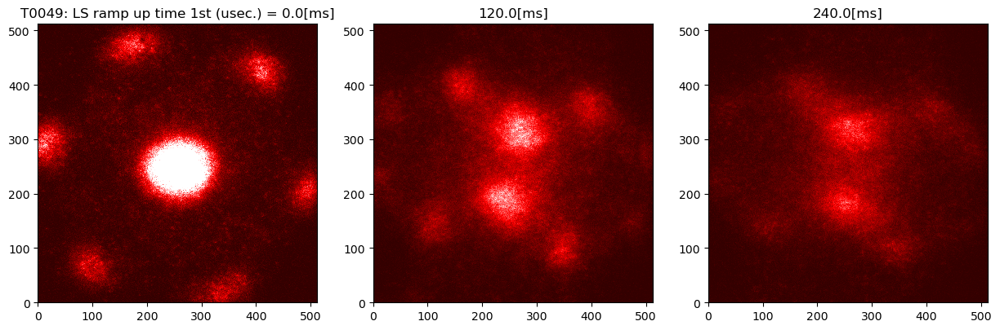

In [1439]:
vmin = 0
vmax = 3000
xlim_1 = 0
xlim_2 = np.shape(img_trans_sample1)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_sample1)[1]

fig =plt.figure(figsize=[15,10])
ax1 = fig.add_subplot(2,3,1)
mappable =ax1.pcolormesh(img_trans_sample1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title(param_name+ " = %.01f"%(unique_param[sample1]*1e-3)+unit)

ax2 = fig.add_subplot(2,3,2)
mappable =ax2.pcolormesh(img_trans_sample2, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)
ax2.set_title("%.01f"%(unique_param[sample2]*1e-3)+unit)

ax3 = fig.add_subplot(2,3,3)
mappable =ax3.pcolormesh(img_trans_sample3, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.set_title("%.01f"%(unique_param[sample3]*1e-3)+unit)

In [1440]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]


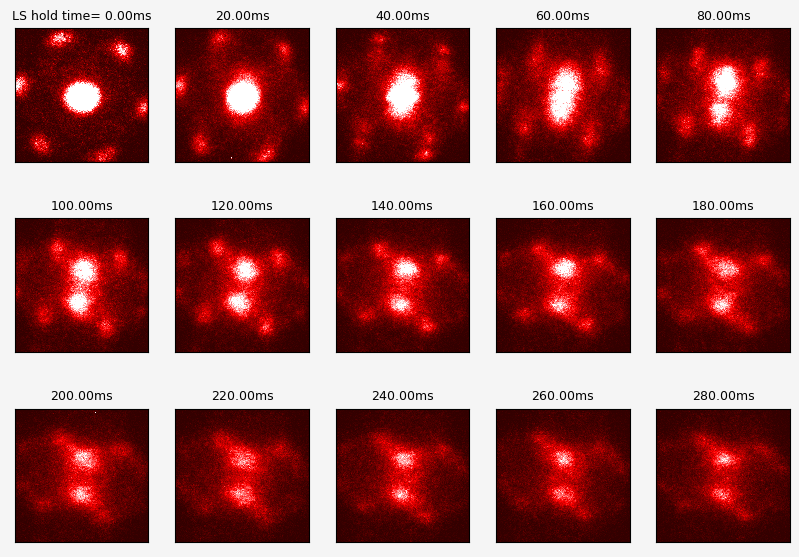

In [1441]:
vmin = 0
vmax = 2000

column_number = 5
row_number = 3

fig, axes = plt.subplots(row_number, column_number, figsize=(10,7), facecolor="whitesmoke",dpi=100)
plt.subplots_adjust(wspace=0.2, hspace=0.2)

if row_number ==1:
    for j in range(column_number):
        if j< column_number:
            axes[j].pcolormesh(img_ave_by_unique_param[j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
            axes[j].set_aspect('equal')
            axes[j].set_xlim(xlim_1,xlim_2)
            axes[j].set_ylim(ylim_1,ylim_2)
            axes[j].xaxis.set_visible(False)
            axes[j].yaxis.set_visible(False)
            if j==0:
                axes[j].set_title('LS ramp up time'+ "\n"+"= %.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
            else:
                axes[j].set_title("%.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
        else:
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
elif row_number >1:
    for i in range(row_number):
        for j in range(column_number):
            if column_number*i+j< column_number*row_number:
                axes[i,j].pcolormesh(img_ave_by_unique_param[column_number*i+j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
                axes[i,j].set_aspect('equal')
                axes[i,j].set_xlim(xlim_1,xlim_2)
                axes[i,j].set_ylim(ylim_1,ylim_2)
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)
                if i==0 and j==0:
                    axes[i,j].set_title('LS hold time'+"= %.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
                else:
                    axes[i,j].set_title("%.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
            else:
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)

In [1442]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 35
r = 28
scalingFacterDependingOnTOF = 2.88
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*(shiftx+np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566]))
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*(shifty+np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663]))
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*(-shiftx+np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566 ]))
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*(-shifty+np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663]))
momentum_peaks_C2_dx_list = np.append(momentum_peaks_C2_dx_list, momentum_peaks_C3_dx_list)
momentum_peaks_C2_dy_list = np.append(momentum_peaks_C2_dy_list, momentum_peaks_C3_dy_list)
momentum_peaks_C3_dx_list = np.array([])
momentum_peaks_C3_dy_list = np.array([])
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])
# momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659])
# momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*np.array([29.7788, 15.980, -45.7598])
# momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*np.array([35.6872832, -43.6125, 7.9659])
# momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*np.array([-29.7788, -15.980, 45.7598])
# momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
# momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])


def calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list):
    shift_dx_list = []
    shift_dy_list = []
    list(map(lambda x: shift_dx_list.extend(x), (momentum_peaks_C1_dx_list, momentum_peaks_C2_dx_list, momentum_peaks_C3_dx_list)))
    list(map(lambda x: shift_dy_list.extend(x), (momentum_peaks_C1_dy_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dy_list)))
    subROI_cx_list = cx+np.array(shift_dx_list)
    subROI_cy_list = cy+np.array(shift_dy_list)
    return subROI_cx_list, subROI_cy_list

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

def extractCircleROI(image, subROI_cx, subROI_cy, r):
    row, column = np.shape(image)
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')
    d2 = np.square(ii - subROI_cy) + np.square(jj - subROI_cx)
    extractedData = np.where(d2 < r * r, image, np.nan)
    return extractedData

def OpticalDensityInExtractedCircleROI(image, subROI_cx, subROI_cy, r):
    row, column = np.shape(image)
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')
    d2 = np.square(ii - subROI_cy) + np.square(jj - subROI_cx)
    extractedData = np.where(d2 < r * r, image, 0)
    normalizedOD = np.sum(extractedData)/np.sum(image)
    return normalizedOD

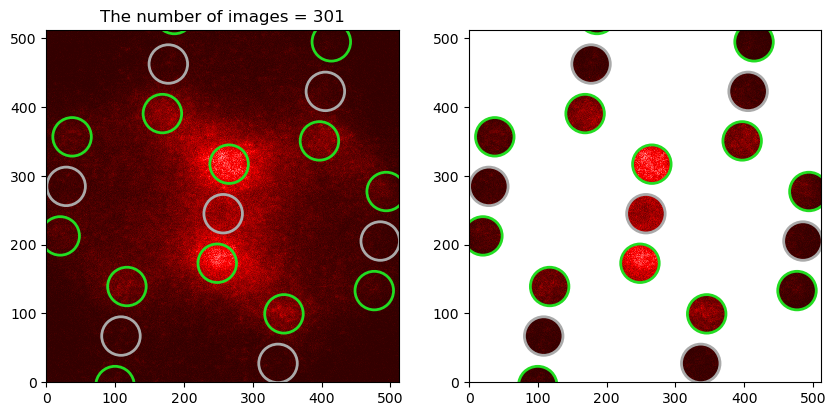

In [1443]:
vmin = 0
vmax = 3000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1444]:
def calculateVisibility(imgs, subROI_cx_list, subROI_cy_list, r):
    row, column = np.shape(imgs_trans[0])
    masks = np.zeros([3, row, column])
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')

    for n_ in range(0, len(momentum_peaks_C1_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[0] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[1] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list)+len(momentum_peaks_C3_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[2] += d2 < r * r

    gamma_list = []
    k1_list = []
    k2_list = []
    visibilityOfChirality_list = []

    for img_ in imgs:
        Norm = np.sum(img_)
        gamma_list += [np.sum(img_ * masks[0])/Norm]
        k1_list += [np.sum(img_ * masks[1])/Norm]
        k2_list += [np.sum(img_ * masks[2])/Norm]

        visibilityOfChirality_list.append((k1_list[-1]-gamma_list[-1])/(gamma_list[-1]+k1_list[-1]))
    x_list = np.arange(0,len(gamma_list),1)

    return x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1445]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

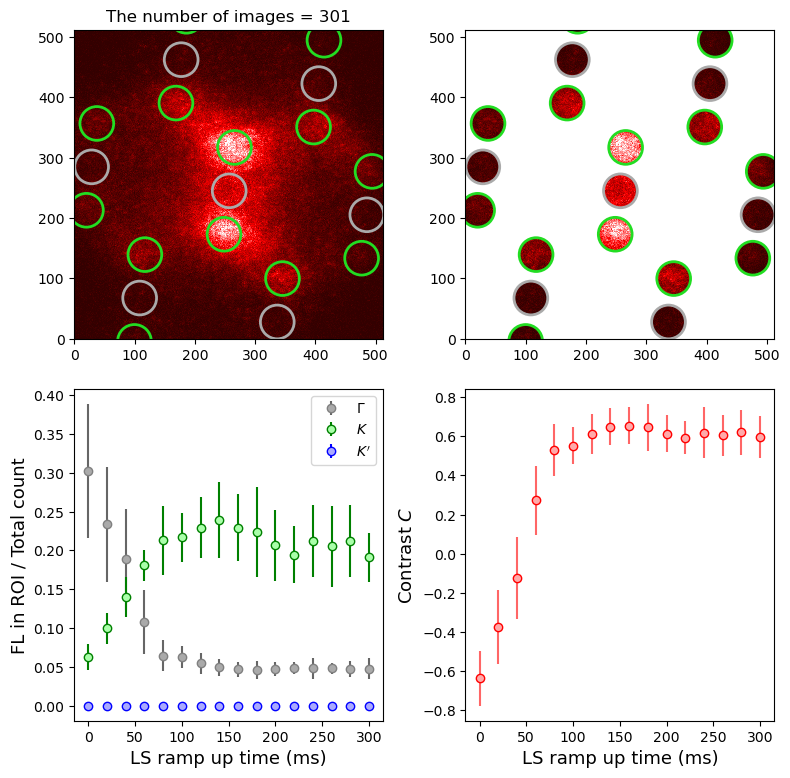

In [1446]:
vmin = 0
vmax = 2000
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'Contrast $C$', fontsize=13)

plt.tight_layout()

fitParameter_0=42.23432845219476(5.2570607511322125)
fitParameter_1=-1.3563080905741836(0.07948801740184827)
fitParameter_2=0.6438164795237267(0.02373498583093701)


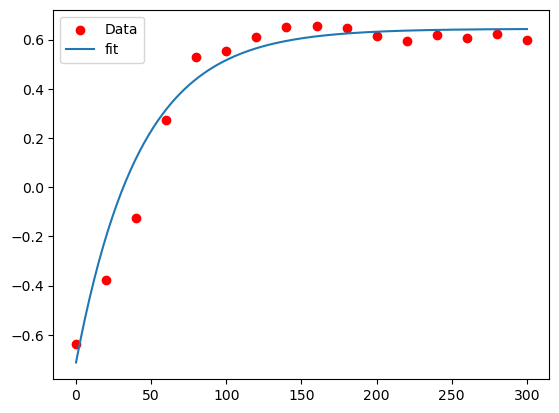

In [1447]:
x_list = unique_param*1e-3
nx = np.array(abs_contrast_list_by_unique_param)
nx_err = np.array(sd_abs_contrast_list_by_unique_param)

def exp(x,*fit_param):
    return fit_param[1]*(np.exp(-x/fit_param[0]))+fit_param[2]

def fit_result(fit_func, x_data_list, y_data_list, initial_param_list, yerr=nx_err):
    if (yerr is None):
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list)
    else:
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list, sigma=yerr)
    perr = np.sqrt(np.diag(cov))
    x_fit_list = np.linspace(np.min(x_data_list),np.max(x_data_list),200)
    y_fit_list = []
    for num in x_fit_list:
        y_fit_list.append(fit_func(num, *param))
    return param, perr, x_fit_list, y_fit_list


para_ini =[40,np.max(x_list),np.mean(nx)]
fitResultsOfSampleImage_list = fit_result(exp, x_list, nx, para_ini)

for i in range(len(para_ini)):
    print("fitParameter_"+str(i)+"="+str(fitResultsOfSampleImage_list[0][i])+"("+str(fitResultsOfSampleImage_list[1][i])+")")

plt.scatter(x_list,nx, label='Data',c="r")
plt.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3],label="fit")
plt.legend()

In [1448]:
def find_root_func(x):
    a = fitResultsOfSampleImage_list[0][1]
    b = fitResultsOfSampleImage_list[0][2]
    tau = fitResultsOfSampleImage_list[0][0]
    residual = a*np.exp(-x/tau)-0.1*a
    return residual

parameter0 =[0]
result = optimize.leastsq(find_root_func,parameter0)
print(result[0][0])
rise_time = result[0][0]
contrast_at_rise_time = exp(rise_time,fitResultsOfSampleImage_list[0][0],fitResultsOfSampleImage_list[0][1],fitResultsOfSampleImage_list[0][2])

97.24813510663793


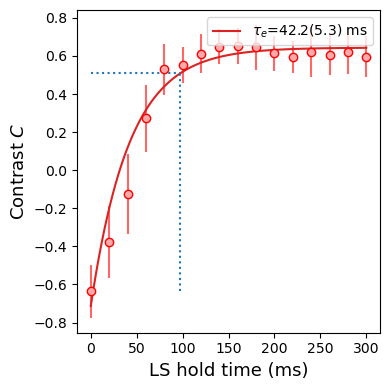

In [1449]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax1.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3], c = '#dd2222',label=r"$\tau_e$=%.01f(%.01f) ms"%(fitResultsOfSampleImage_list[0][0], fitResultsOfSampleImage_list[1][0]))
ax1.set_xlabel('LS hold time (ms)', fontsize=13)
ax1.set_ylabel(r'Contrast $C$', fontsize=13)
ax1.vlines(x=rise_time,ymin=np.min(abs_contrast_list_by_unique_param),ymax=contrast_at_rise_time,linestyles=':')
ax1.hlines(y=contrast_at_rise_time, xmin=np.min(unique_param),xmax=rise_time,linestyles=':')
ax1.legend()
plt.tight_layout()

In [1450]:
contrast_list_spiral2 = []
sd_contrast_list_spiral2 = []
unique_param_spiral2 = []
fit_x_contrast_spiral2 = []
fit_y_contrast_spiral2 = []
fit_result_contrast_spiral2 = []

unique_param_spiral2 = unique_param
contrast_list_spiral2.append(abs_contrast_list_by_unique_param)
sd_contrast_list_spiral2.append(sd_abs_contrast_list_by_unique_param)
fitResults_contrast_spiral2 = fitResultsOfSampleImage_list

rise_time_spiral2 = rise_time
contrast_at_rise_time_spiral2 = contrast_at_rise_time
sampleImage_contrast_spiral2 = img_trans_sample3
r_contrast_spiral2 = r
subROI_cx_list_contrast_spiral2 = subROI_cx_list
subROI_cy_list_contrast_spiral2 = subROI_cy_list
momentum_peaks_C3_dx_list_contrast_spiral2 = momentum_peaks_C3_dx_list
momentum_peaks_C2_dx_list_contrast_spiral2 = momentum_peaks_C2_dx_list 
momentum_peaks_C1_dx_list_contrast_spiral2 = momentum_peaks_C1_dx_list

# Chiral contrast in Spiral 2

In [1451]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 35
r = 28
scalingFacterDependingOnTOF = 2.88
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*(shiftx+np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566]))
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*(shifty+np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663]))
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*(-shiftx+np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566 ]))
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*(-shifty+np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663]))
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([])

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

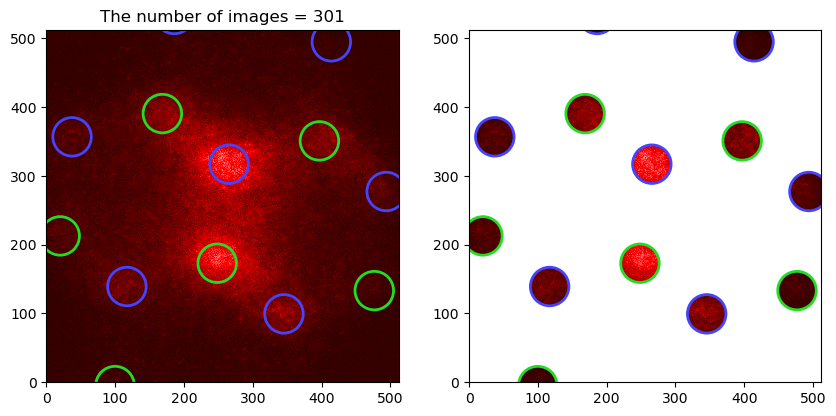

In [1452]:
vmin = 0
vmax = 3000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1453]:
def calculateVisibility(imgs, subROI_cx_list, subROI_cy_list, r):
    row, column = np.shape(imgs_trans[0])
    masks = np.zeros([3, row, column])
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')

    for n_ in range(0, len(momentum_peaks_C1_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[0] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[1] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list)+len(momentum_peaks_C3_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[2] += d2 < r * r

    gamma_list = []
    k1_list = []
    k2_list = []
    visibilityOfChirality_list = []

    for img_ in imgs:
        Norm = np.sum(img_)
        gamma_list += [np.sum(img_ * masks[0])/Norm]
        k1_list += [np.sum(img_ * masks[1])/Norm]
        k2_list += [np.sum(img_ * masks[2])/Norm]

        visibilityOfChirality_list.append(np.abs(k1_list[-1]-k2_list[-1])/(k2_list[-1]+k1_list[-1]))
    x_list = np.arange(0,len(gamma_list),1)

    return x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

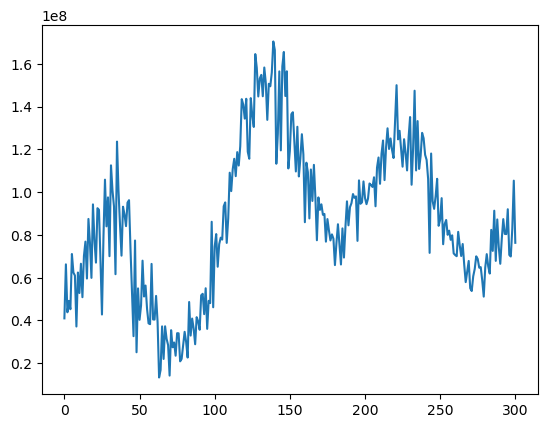

In [1454]:
flcount = scan_data['Total count @ ROI1 (arb. u.)']
plt.plot(flcount)

In [1455]:
threshold = 0.2e8
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j] and flcount[j]>threshold:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

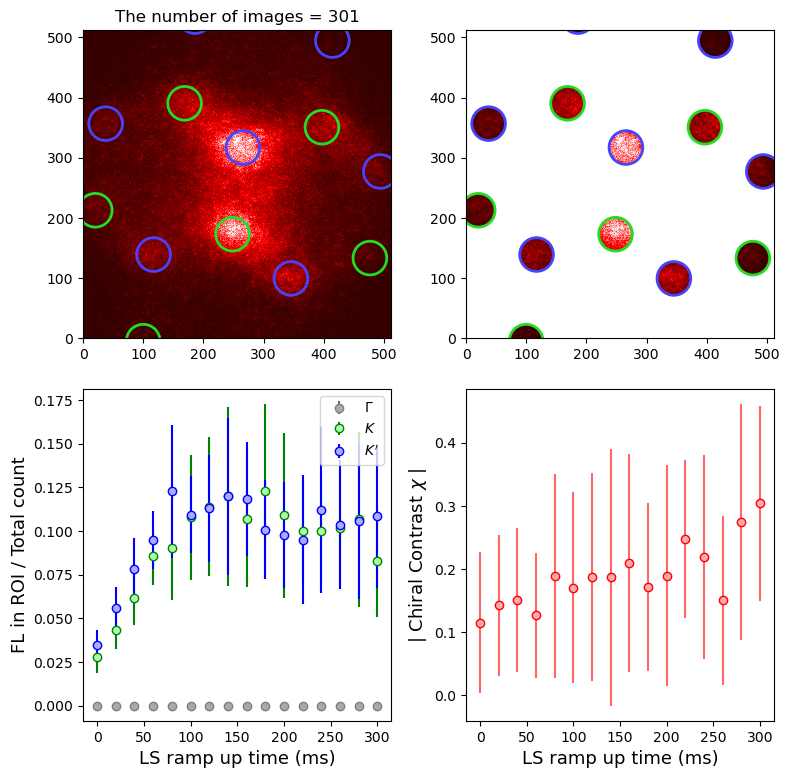

In [1456]:
vmin = 0
vmax = 2000
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=13)

plt.tight_layout()

fitParameter_0=0.000419826042383906(8.527791038825708e-05)
fitParameter_1=0.12331562965059692(0.013611566250156788)


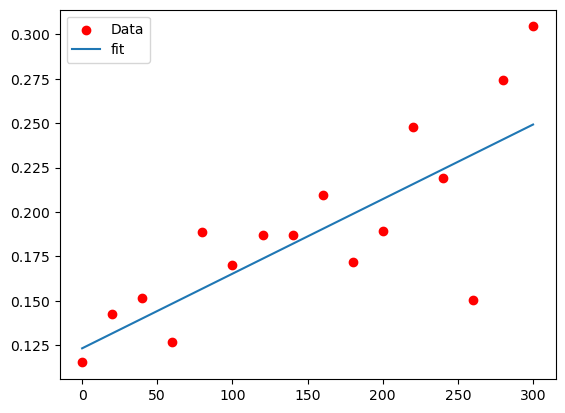

In [1457]:
x_list = unique_param*1e-3
nx = np.array(abs_contrast_list_by_unique_param)
nx_err = np.array(sd_abs_contrast_list_by_unique_param)

# def cosine(x,*fit_param):
#     return fit_param[1]*np.cos(2*np.pi*fit_param[0]*x)+fit_param[2]
def fit_func(x,*fit_param):
    return fit_param[0]*x+fit_param[1]

def fit_result(fit_func, x_data_list, y_data_list, initial_param_list, yerr=nx_err):
    if (yerr is None):
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list)
    else:
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list, sigma=yerr)
    perr = np.sqrt(np.diag(cov))
    x_fit_list = np.linspace(np.min(x_data_list),np.max(x_data_list),200)
    y_fit_list = []
    for num in x_fit_list:
        y_fit_list.append(fit_func(num, *param))
    return param, perr, x_fit_list, y_fit_list


para_ini =[40,np.max(x_list)]
fitResultsOfSampleImage_list = fit_result(fit_func, x_list, nx, para_ini)

for i in range(len(para_ini)):
    print("fitParameter_"+str(i)+"="+str(fitResultsOfSampleImage_list[0][i])+"("+str(fitResultsOfSampleImage_list[1][i])+")")

plt.scatter(x_list,nx, label='Data',c="r")
plt.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3],label="fit")
plt.legend()

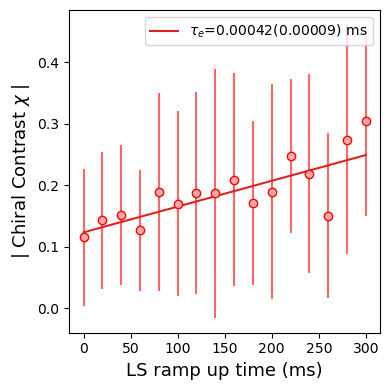

In [1458]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax1.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3], c = '#dd2222',label=r"$\tau_e$=%.05f(%.05f) ms"%(fitResultsOfSampleImage_list[0][0], fitResultsOfSampleImage_list[1][0]))
ax1.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax1.set_ylabel(r'| Chiral Contrast $ \chi $ |', fontsize=13)
ax1.legend()
plt.tight_layout()

In [1459]:
abs_chiral_contrast_list_spiral2 = []
sd_abs_chiral_contrast_list_spiral2 = []
fit_x_abs_chiral_contrast_spiral2 = []
fit_y_abs_chiral_contrast_spiral2 = []
fit_result_abs_chiral_contrast_spiral2 = []

abs_chiral_contrast_list_spiral2.append(abs_contrast_list_by_unique_param)
sd_abs_chiral_contrast_list_spiral2.append(sd_abs_contrast_list_by_unique_param)
fitResults_abs_chiral_contrast_spiral2 = fitResultsOfSampleImage_list
sampleImage_abs_chiral_contrast_spiral2 = img_trans_sample3
r_abs_chiral_contrast_spiral2 = r
subROI_cx_list_abs_chiral_contrast_spiral2 = subROI_cx_list
subROI_cy_list_abs_chiral_contrast_spiral2 = subROI_cy_list
momentum_peaks_C3_dx_list_abs_chiral_contrast_spiral2 = momentum_peaks_C3_dx_list
momentum_peaks_C2_dx_list_abs_chiral_contrast_spiral2 = momentum_peaks_C2_dx_list 
momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral2 = momentum_peaks_C1_dx_list

# Summary of Spiral 2

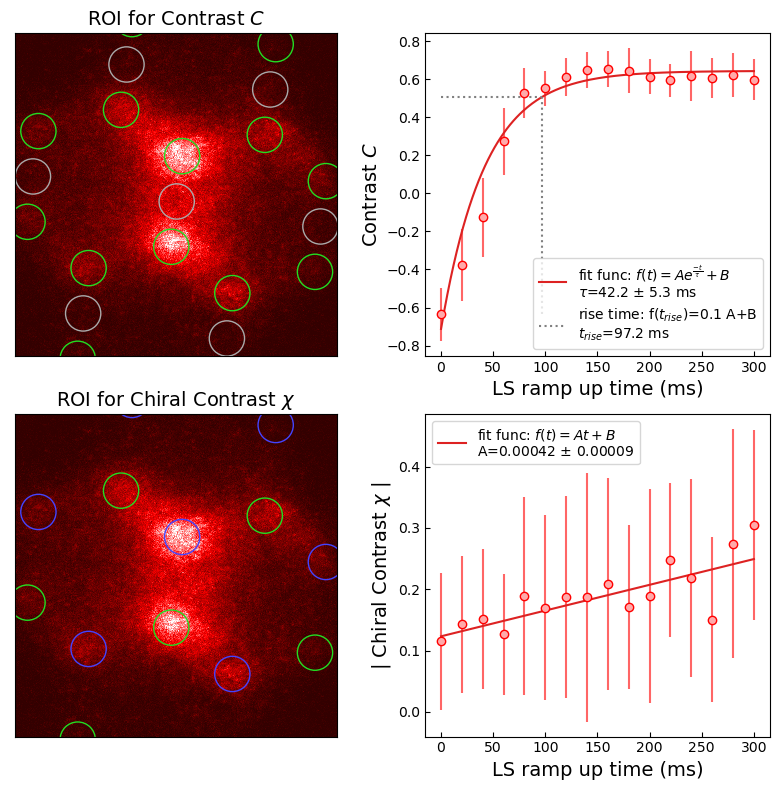

In [1460]:
vmin = 0
vmax = 2000
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(sampleImage_contrast_spiral2 , cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title(r"ROI for Contrast $C$", fontsize=14)
for i in range(len(subROI_cx_list_contrast_spiral2)):
    if i < len(momentum_peaks_C1_dx_list_contrast_spiral2):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list_contrast_spiral2)<=i<len(momentum_peaks_C1_dx_list_contrast_spiral2)+len(momentum_peaks_C2_dx_list_contrast_spiral2):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list_contrast_spiral2[i], y=subROI_cy_list_contrast_spiral2[i]), radius=r_contrast_spiral2)
    region.plot(ax=ax1, color=color, lw=1, linestyle = '-')

label=r'fit func: $f(t)=A e^{\frac{-t}{\tau}}+B$'+"\n"+r"$\tau$=%.01f $\pm$ %.01f ms"%(fitResults_contrast_spiral2[0][0], fitResults_contrast_spiral2[1][0])
label_2 = r'rise time: f($t_{rise}$)=0.1 A+B'+'\n'+r'$t_{rise}$=%.01f ms'%(rise_time_spiral2)
ax2 = fig.add_subplot(2,2,2)
ax2.errorbar(unique_param_spiral2*1e-3, contrast_list_spiral2[0], sd_contrast_list_spiral2[0],fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax2.plot(fitResults_contrast_spiral2[2],fitResults_contrast_spiral2[3], c = '#dd2222',label=label)
ax2.vlines(x=rise_time_spiral2,ymin=np.min(contrast_list_spiral2[0]),ymax=contrast_at_rise_time_spiral2,linestyles=':',colors='gray',label=label_2)
ax2.hlines(y=contrast_at_rise_time_spiral2, xmin=0,xmax=rise_time_spiral2,linestyles=':',colors='gray')
ax2.set_xlabel('LS ramp up time (ms)', fontsize=14)
ax2.set_ylabel(r'Contrast $C$', fontsize=14)
ax2.tick_params(axis='both',direction='in')
ax2.legend(loc='lower right')

ax3 = fig.add_subplot(2,2,3)
mappable =ax3.pcolormesh(sampleImage_abs_chiral_contrast_spiral2 , cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.xaxis.set_visible(False)
ax3.yaxis.set_visible(False)
ax3.set_title(r"ROI for Chiral Contrast $\chi$", fontsize=14)
for i in range(len(subROI_cx_list_abs_chiral_contrast_spiral2)):
    if i < len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral2):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral2)<=i<len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral2)+len(momentum_peaks_C2_dx_list_abs_chiral_contrast_spiral2):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list_abs_chiral_contrast_spiral2[i], y=subROI_cy_list_abs_chiral_contrast_spiral2[i]), radius=r_abs_chiral_contrast_spiral2)
    region.plot(ax=ax3, color=color, lw=1, linestyle = '-')

label=r'fit func: $f(t)=A t+B$'
ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param_spiral2*1e-3, abs_chiral_contrast_list_spiral2[0], sd_abs_chiral_contrast_list_spiral2[0],fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.plot(fitResults_abs_chiral_contrast_spiral2[2],fitResults_abs_chiral_contrast_spiral2[3], c = '#dd2222',label=label+'\n'+r"A=%.05f $\pm$ %.05f"%(fitResults_abs_chiral_contrast_spiral2[0][0], fitResults_abs_chiral_contrast_spiral2[1][0]))
ax4.set_xlabel('LS ramp up time (ms)', fontsize=14)
ax4.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=14)
ax4.tick_params(axis='both',direction='in')
ax4.legend(loc='upper left')

plt.tight_layout()

# Contrast in Spiral 1

## 2023/01/29 Data002

In [1461]:
date = '20230129'
dataNo = 2
scanNo = 2

In [1462]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [1463]:
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

In [1464]:
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 6
sample3 = 12
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [1465]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1466]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

Text(0.5, 1.0, '120.0[ms]')

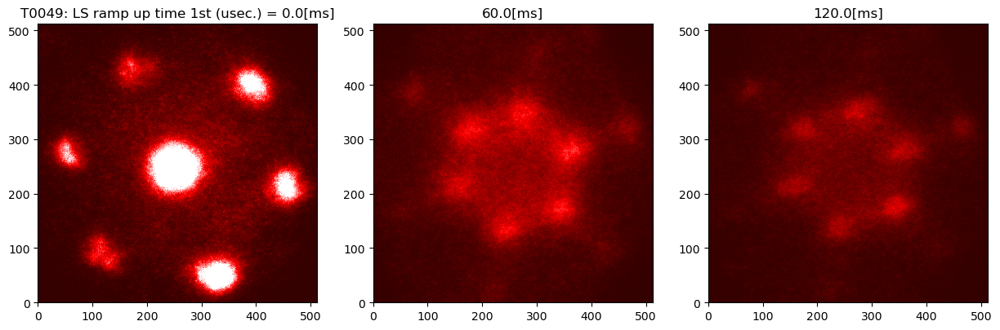

In [1467]:
vmin = 0
vmax = 3000
xlim_1 = 0
xlim_2 = np.shape(img_trans_sample1)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_sample1)[1]

fig =plt.figure(figsize=[15,10])
ax1 = fig.add_subplot(2,3,1)
mappable =ax1.pcolormesh(img_trans_sample1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title(param_name+ " = %.01f"%(unique_param[sample1]*1e-3)+unit)

ax2 = fig.add_subplot(2,3,2)
mappable =ax2.pcolormesh(img_trans_sample2, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)
ax2.set_title("%.01f"%(unique_param[sample2]*1e-3)+unit)

ax3 = fig.add_subplot(2,3,3)
mappable =ax3.pcolormesh(img_trans_sample3, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.set_title("%.01f"%(unique_param[sample3]*1e-3)+unit)

In [1468]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]


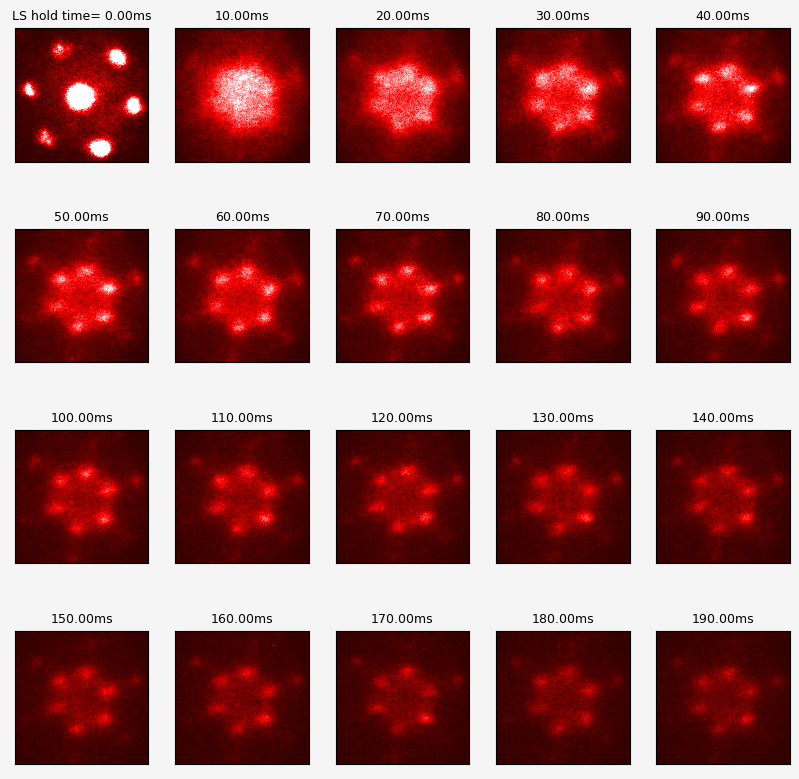

In [1469]:
vmin = 0
vmax = 2000

column_number = 5
row_number = 4

fig, axes = plt.subplots(row_number, column_number, figsize=(10,10), facecolor="whitesmoke",dpi=100)
plt.subplots_adjust(wspace=0.2, hspace=0.2)

if row_number ==1:
    for j in range(column_number):
        if j< column_number:
            axes[j].pcolormesh(img_ave_by_unique_param[j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
            axes[j].set_aspect('equal')
            axes[j].set_xlim(xlim_1,xlim_2)
            axes[j].set_ylim(ylim_1,ylim_2)
            axes[j].xaxis.set_visible(False)
            axes[j].yaxis.set_visible(False)
            if j==0:
                axes[j].set_title('LS ramp up time'+ "\n"+"= %.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
            else:
                axes[j].set_title("%.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
        else:
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
elif row_number >1:
    for i in range(row_number):
        for j in range(column_number):
            if column_number*i+j< column_number*row_number:
                axes[i,j].pcolormesh(img_ave_by_unique_param[column_number*i+j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
                axes[i,j].set_aspect('equal')
                axes[i,j].set_xlim(xlim_1,xlim_2)
                axes[i,j].set_ylim(ylim_1,ylim_2)
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)
                if i==0 and j==0:
                    axes[i,j].set_title('LS hold time'+"= %.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
                else:
                    axes[i,j].set_title("%.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
            else:
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)

In [1470]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 35
r = 28
scalingFacterDependingOnTOF = 2.4
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659, 35.6872832, -43.6125, 7.9659])
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*np.array([29.7788, 15.980, -45.7598,-29.7788, -15.980, 45.7598])
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

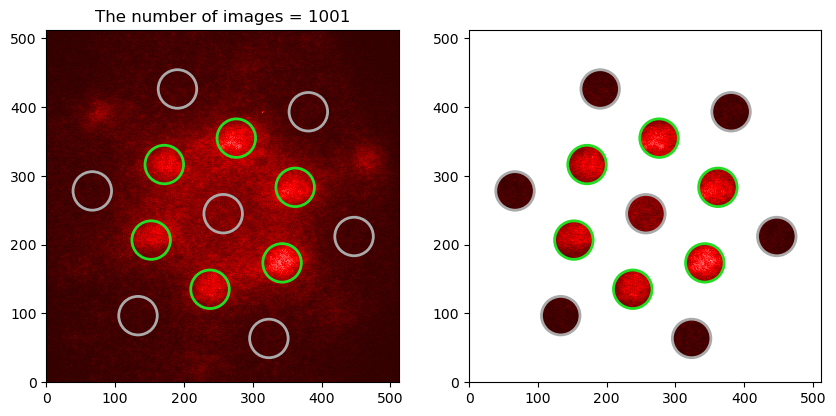

In [1471]:
vmin = 0
vmax = 2000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1472]:
def calculateVisibility(imgs, subROI_cx_list, subROI_cy_list, r):
    row, column = np.shape(imgs_trans[0])
    masks = np.zeros([3, row, column])
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')

    for n_ in range(0, len(momentum_peaks_C1_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[0] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[1] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list)+len(momentum_peaks_C3_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[2] += d2 < r * r

    gamma_list = []
    k1_list = []
    k2_list = []
    visibilityOfChirality_list = []

    for img_ in imgs:
        Norm = np.sum(img_)
        gamma_list += [np.sum(img_ * masks[0])/Norm]
        k1_list += [np.sum(img_ * masks[1])/Norm]
        k2_list += [np.sum(img_ * masks[2])/Norm]

        visibilityOfChirality_list.append((k1_list[-1]-gamma_list[-1])/(gamma_list[-1]+k1_list[-1]))
    x_list = np.arange(0,len(gamma_list),1)

    return x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1473]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

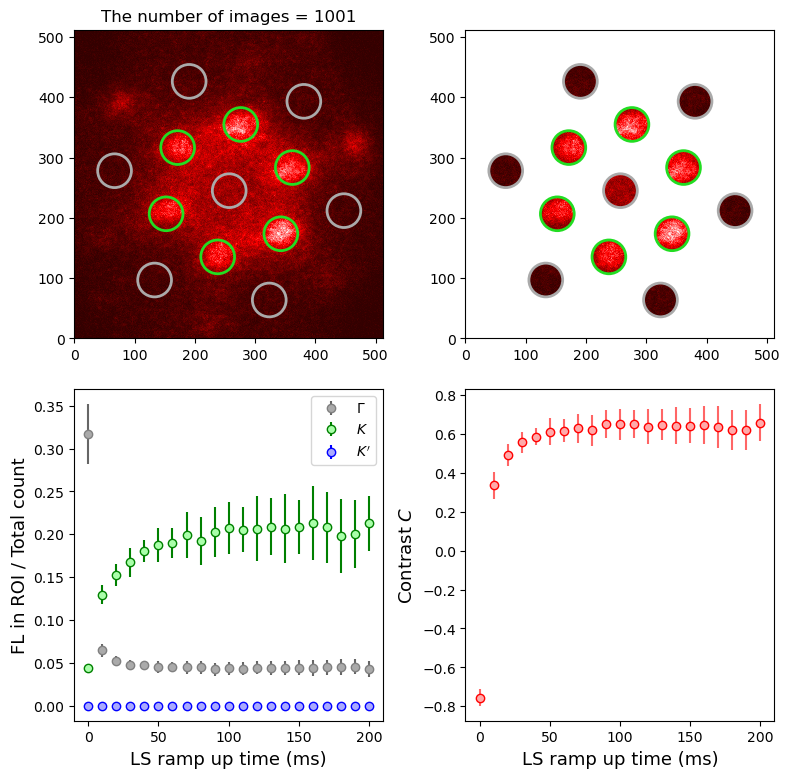

In [1474]:
vmin = 0
vmax = 1500
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'Contrast $C$', fontsize=13)

plt.tight_layout()

In [1475]:
contrast_list_spiral1 = []
sd_contrast_list_spiral1 = []
unique_param_spiral1 = []
fit_x_contrast_spiral1 = []
fit_y_contrast_spiral1 = []
fit_result_contrast_spiral1 = []

unique_param_spiral1.append(unique_param)
contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)
sampleImage_contrast_spiral1 = img_trans_sample3
# fitResults_contrast_spiral1 = fitResultsOfSampleImage_list
# r_contrast_spiral1 = r
# subROI_cx_list_contrast_spiral1 = subROI_cx_list
# subROI_cy_list_contrast_spiral1 = subROI_cy_list
# momentum_peaks_C3_dx_list_contrast_spiral = momentum_peaks_C3_dx_list
# momentum_peaks_C2_dx_list_contrast_spiral1 = momentum_peaks_C2_dx_list 
# momentum_peaks_C1_dx_list_contrast_spiral1 = momentum_peaks_C1_dx_list

## 2023/02/01 Data003

In [1476]:
date = '20230201'
dataNo = 3
scanNo = 3

In [1477]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [1478]:
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

In [1479]:
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 1
sample3 = 2
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [1480]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1481]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

Text(0.5, 1.0, '9.0[ms]')

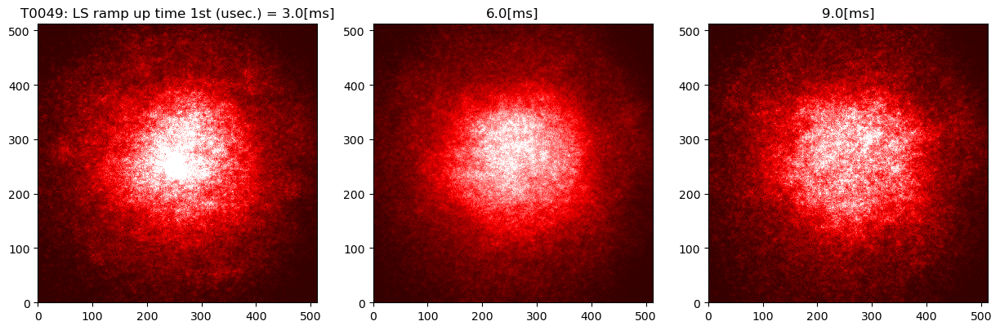

In [1482]:
vmin = 0
vmax = 3000
xlim_1 = 0
xlim_2 = np.shape(img_trans_sample1)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_sample1)[1]

fig =plt.figure(figsize=[15,10])
ax1 = fig.add_subplot(2,3,1)
mappable =ax1.pcolormesh(img_trans_sample1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title(param_name+ " = %.01f"%(unique_param[sample1]*1e-3)+unit)

ax2 = fig.add_subplot(2,3,2)
mappable =ax2.pcolormesh(img_trans_sample2, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)
ax2.set_title("%.01f"%(unique_param[sample2]*1e-3)+unit)

ax3 = fig.add_subplot(2,3,3)
mappable =ax3.pcolormesh(img_trans_sample3, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.set_title("%.01f"%(unique_param[sample3]*1e-3)+unit)

In [1483]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]

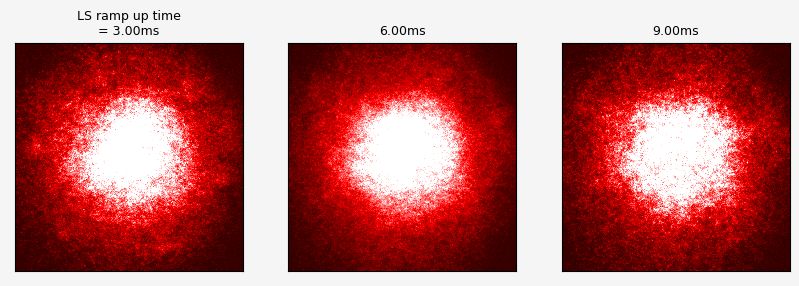

In [1484]:
vmin = 0
vmax = 2000

column_number = 3
row_number = 1

fig, axes = plt.subplots(row_number, column_number, figsize=(10,10), facecolor="whitesmoke",dpi=100)
plt.subplots_adjust(wspace=0.2, hspace=0.2)

if row_number ==1:
    for j in range(column_number):
        if j< column_number:
            axes[j].pcolormesh(img_ave_by_unique_param[j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
            axes[j].set_aspect('equal')
            axes[j].set_xlim(xlim_1,xlim_2)
            axes[j].set_ylim(ylim_1,ylim_2)
            axes[j].xaxis.set_visible(False)
            axes[j].yaxis.set_visible(False)
            if j==0:
                axes[j].set_title('LS ramp up time'+ "\n"+"= %.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
            else:
                axes[j].set_title("%.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
        else:
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
elif row_number >1:
    for i in range(row_number):
        for j in range(column_number):
            if column_number*i+j< column_number*row_number:
                axes[i,j].pcolormesh(img_ave_by_unique_param[column_number*i+j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
                axes[i,j].set_aspect('equal')
                axes[i,j].set_xlim(xlim_1,xlim_2)
                axes[i,j].set_ylim(ylim_1,ylim_2)
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)
                if i==0 and j==0:
                    axes[i,j].set_title('LS hold time'+"= %.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
                else:
                    axes[i,j].set_title("%.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
            else:
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)

In [1485]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 35
r = 28
scalingFacterDependingOnTOF = 2.4
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659, 35.6872832, -43.6125, 7.9659])
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*np.array([29.7788, 15.980, -45.7598,-29.7788, -15.980, 45.7598])
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

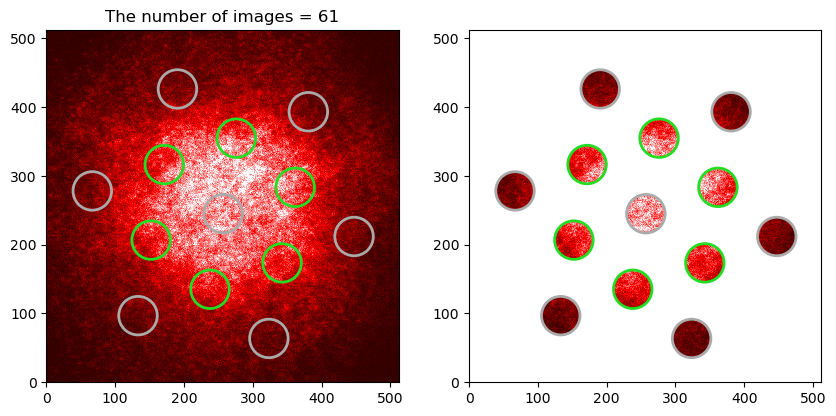

In [1486]:
vmin = 0
vmax = 3000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1487]:
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1488]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

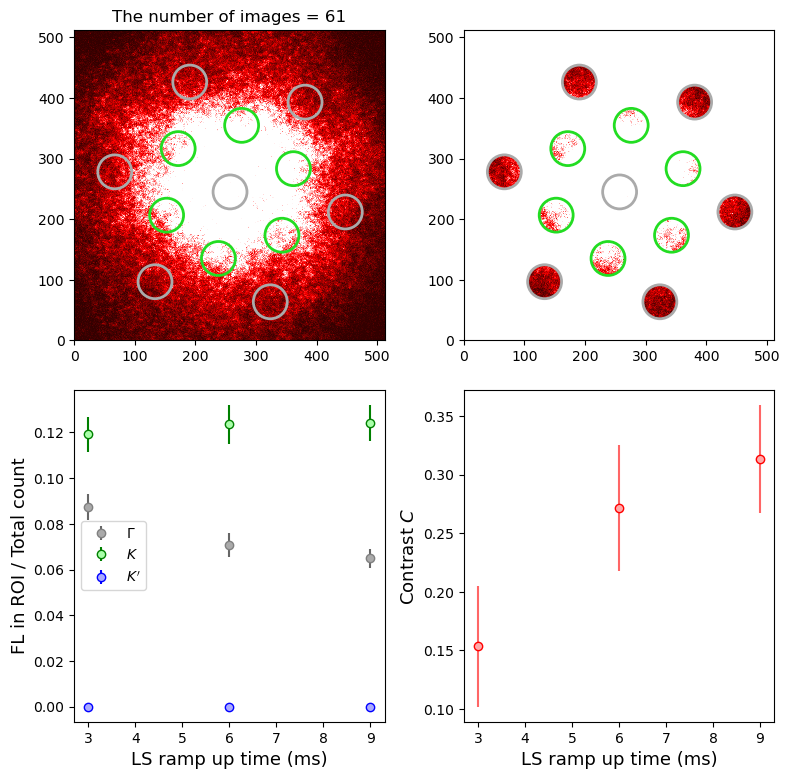

In [1489]:
vmin = 0
vmax = 1500
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'Contrast $C$', fontsize=13)

plt.tight_layout()

In [1490]:
unique_param_spiral1.append(unique_param)
contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)

# 2023/02/02 Data001

In [1491]:
date = '20230202'
dataNo = 1
scanNo = 1

In [1492]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [1493]:
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

In [1494]:
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 1
sample3 = 2
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [1495]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1496]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

In [1497]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]

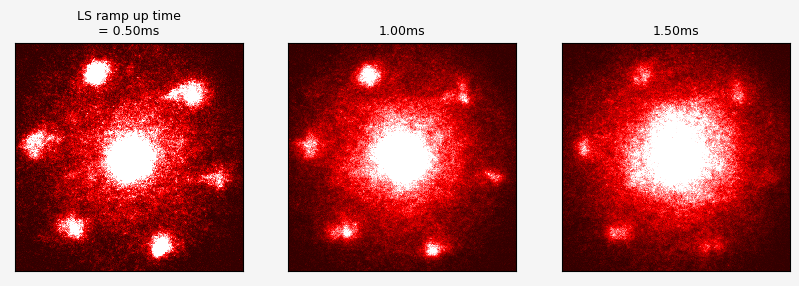

In [1498]:
vmin = 0
vmax = 2000

column_number = 3
row_number = 1

fig, axes = plt.subplots(row_number, column_number, figsize=(10,10), facecolor="whitesmoke",dpi=100)
plt.subplots_adjust(wspace=0.2, hspace=0.2)

if row_number ==1:
    for j in range(column_number):
        if j< column_number:
            axes[j].pcolormesh(img_ave_by_unique_param[j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
            axes[j].set_aspect('equal')
            axes[j].set_xlim(xlim_1,xlim_2)
            axes[j].set_ylim(ylim_1,ylim_2)
            axes[j].xaxis.set_visible(False)
            axes[j].yaxis.set_visible(False)
            if j==0:
                axes[j].set_title('LS ramp up time'+ "\n"+"= %.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
            else:
                axes[j].set_title("%.02f"%(unique_param[j]*1e-3)+'ms', fontsize=9)
        else:
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].yaxis.set_visible(False)
elif row_number >1:
    for i in range(row_number):
        for j in range(column_number):
            if column_number*i+j< column_number*row_number:
                axes[i,j].pcolormesh(img_ave_by_unique_param[column_number*i+j], cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
                axes[i,j].set_aspect('equal')
                axes[i,j].set_xlim(xlim_1,xlim_2)
                axes[i,j].set_ylim(ylim_1,ylim_2)
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)
                if i==0 and j==0:
                    axes[i,j].set_title('LS hold time'+"= %.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
                else:
                    axes[i,j].set_title("%.02f"%(unique_param[column_number*i+j]*1e-3)+'ms', fontsize=9)
            else:
                axes[i,j].xaxis.set_visible(False)
                axes[i,j].yaxis.set_visible(False)

In [1499]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 35
r = 28
scalingFacterDependingOnTOF = 2.4
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*np.array([])
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659, 35.6872832, -43.6125, 7.9659])
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*np.array([29.7788, 15.980, -45.7598,-29.7788, -15.980, 45.7598])
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

In [1500]:
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1501]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

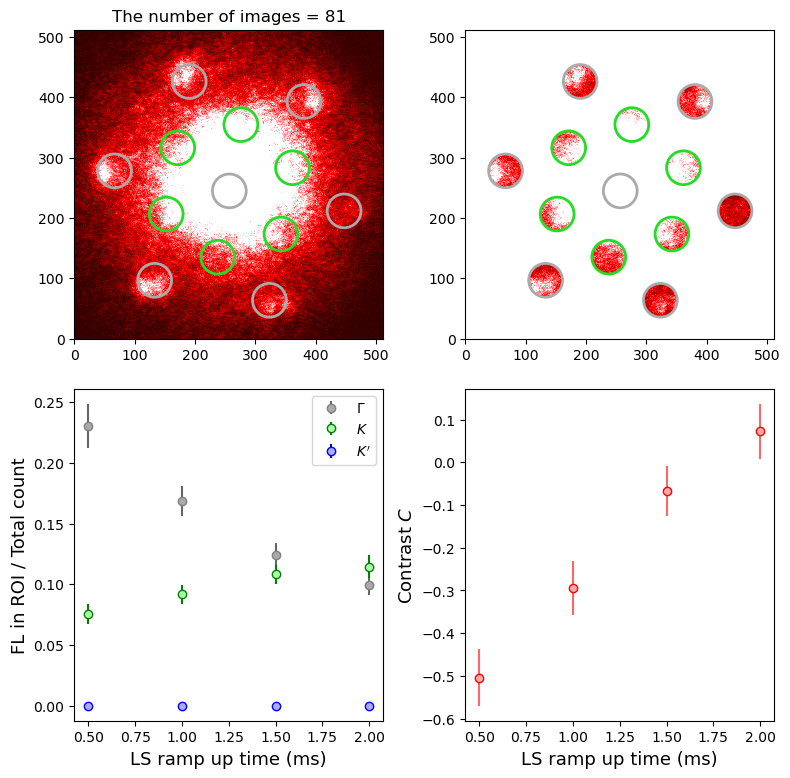

In [1502]:
vmin = 0
vmax = 1500
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'Contrast $C$', fontsize=13)

plt.tight_layout()

In [1503]:
unique_param_spiral1.append(unique_param)
contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)

In [1504]:
import itertools

unique_param_spiral1 = np.array(list(itertools.chain.from_iterable(unique_param_spiral1)))
contrast_list_spiral1 = np.array(list(itertools.chain.from_iterable(contrast_list_spiral1)))
sd_contrast_list_spiral1 = np.array(list(itertools.chain.from_iterable(sd_contrast_list_spiral1)))

fitParameter_0=10.517094250328402(0.8927309506162883)
fitParameter_1=-1.3818052837033328(0.027278692093436505)
fitParameter_2=0.6285604905128659(0.0116996249395405)
fitParameter_3=0.9023747838617026(0.09988693358739438)


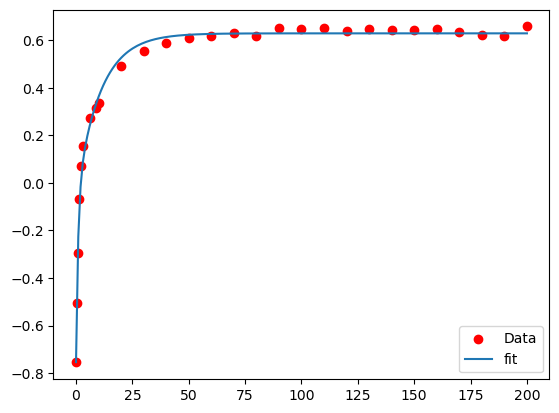

In [1505]:
x_list = np.array(unique_param_spiral1)*1e-3
nx = np.array(contrast_list_spiral1)
nx_err = np.array(sd_contrast_list_spiral1)

# def exp(x,*fit_param):
#     return fit_param[1]*np.exp(-x/fit_param[0])+fit_param[2]

def exp(x,*fit_param):
    return fit_param[1]/2*(np.exp(-x/fit_param[0])+np.exp(-x/fit_param[3]))+fit_param[2]

def fit_result(fit_func, x_data_list, y_data_list, initial_param_list, yerr=nx_err):
    if (yerr is None):
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list)
    else:
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list, sigma=yerr)
    perr = np.sqrt(np.diag(cov))
    x_fit_list = np.linspace(np.min(x_data_list),np.max(x_data_list),200)
    y_fit_list = []
    for num in x_fit_list:
        y_fit_list.append(fit_func(num, *param))
    return param, perr, x_fit_list, y_fit_list


para_ini =[2,np.max(x_list),np.mean(nx),0.5]
fitResultsOfSampleImage_list = fit_result(exp, x_list, nx, para_ini)

for i in range(len(para_ini)):
    print("fitParameter_"+str(i)+"="+str(fitResultsOfSampleImage_list[0][i])+"("+str(fitResultsOfSampleImage_list[1][i])+")")

plt.scatter(x_list,nx, label='Data',c="r")
plt.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3],label="fit")
plt.legend()

In [1506]:
def find_root_func(x):
    a = fitResultsOfSampleImage_list[0][1]
    b = fitResultsOfSampleImage_list[0][2]
    tau_slow = fitResultsOfSampleImage_list[0][0]
    tau_fast = fitResultsOfSampleImage_list[0][3]
    residual = a/2*(np.exp(-x/tau_fast)+np.exp(-x/tau_slow))-0.1*a
    return residual

parameter0 =[0]
result = optimize.leastsq(find_root_func,parameter0)
print(result[0][0])
rise_time = result[0][0]
contrast_at_rise_time = exp(rise_time,fitResultsOfSampleImage_list[0][0],fitResultsOfSampleImage_list[0][1],fitResultsOfSampleImage_list[0][2],fitResultsOfSampleImage_list[0][3])

16.926610590470126


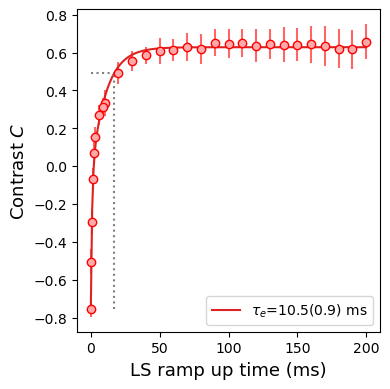

In [1507]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral1 *1e-3, contrast_list_spiral1, sd_contrast_list_spiral1,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax1.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3], c = '#dd2222',label=r"$\tau_e$=%.01f(%.01f) ms"%(fitResultsOfSampleImage_list[0][0], fitResultsOfSampleImage_list[1][0]))
ax1.vlines(x=rise_time,ymin=np.min(contrast_list_spiral1),ymax=contrast_at_rise_time,linestyles=':',colors='gray')
ax1.hlines(y=contrast_at_rise_time, xmin=0,xmax=rise_time,linestyles=':',colors='gray')
ax1.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax1.set_ylabel(r'Contrast $C$', fontsize=13)
ax1.legend()
plt.tight_layout()

In [1508]:
fitResults_contrast_spiral1 = fitResultsOfSampleImage_list
rise_time_spiral1 = rise_time
contrast_at_rise_time_spiral1 = contrast_at_rise_time

r_contrast_spiral1 = r
subROI_cx_list_contrast_spiral1 = subROI_cx_list
subROI_cy_list_contrast_spiral1 = subROI_cy_list
momentum_peaks_C3_dx_list_contrast_spiral1 = momentum_peaks_C3_dx_list
momentum_peaks_C2_dx_list_contrast_spiral1 = momentum_peaks_C2_dx_list 
momentum_peaks_C1_dx_list_contrast_spiral1 = momentum_peaks_C1_dx_list

# Chiral contrast in Spiral 1

## 2023/01/29 Data002

In [1509]:
date = '20230129'
dataNo = 2
scanNo = 2

In [1510]:
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')

In [1511]:
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

columns_sweep

['Total count @ ROI1 (arb. u.)', 'T0049: LS ramp up time 1st (usec.)']

In [1512]:
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 6
sample3 = 12
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

In [1513]:
share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1514]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

Text(0.5, 1.0, '120.0[ms]')

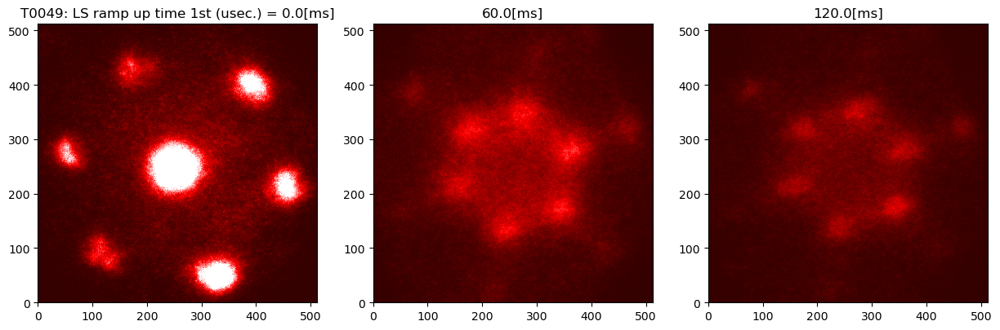

In [1515]:
vmin = 0
vmax = 3000
xlim_1 = 0
xlim_2 = np.shape(img_trans_sample1)[0]
ylim_1 = 0
ylim_2 = np.shape(img_trans_sample1)[1]

fig =plt.figure(figsize=[15,10])
ax1 = fig.add_subplot(2,3,1)
mappable =ax1.pcolormesh(img_trans_sample1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title(param_name+ " = %.01f"%(unique_param[sample1]*1e-3)+unit)

ax2 = fig.add_subplot(2,3,2)
mappable =ax2.pcolormesh(img_trans_sample2, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)
ax2.set_title("%.01f"%(unique_param[sample2]*1e-3)+unit)

ax3 = fig.add_subplot(2,3,3)
mappable =ax3.pcolormesh(img_trans_sample3, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.set_title("%.01f"%(unique_param[sample3]*1e-3)+unit)

In [1516]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]


In [1517]:
cx = 257
cy = 245
shiftx = 3
shifty = 25
# r = 32
r = 28
scalingFacterDependingOnTOF = 2.4
momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659, 71.292, -87.225, 15.9318])
momentum_peaks_C3_dy_list = scalingFacterDependingOnTOF*np.array([29.7788, 15.980, -45.7598, -59.5576, -31.96,91.5196])
momentum_peaks_C2_dx_list = scalingFacterDependingOnTOF*np.array([35.6872832, -43.6125, 7.9659, -71.292, 87.225, -15.9318])
momentum_peaks_C2_dy_list = scalingFacterDependingOnTOF*np.array([-29.7788, -15.980, 45.7598, 59.5576, 31.96, -91.5196])
momentum_peaks_C1_dx_list = scalingFacterDependingOnTOF*np.array([0, 79.256753984491, -79.256753984491, 27.679518850925, -27.679518850925, -51.577235133566, 51.577235133566])
momentum_peaks_C1_dy_list = scalingFacterDependingOnTOF*np.array([0, -13.7973529288, 13.7973529288, -75.537038836463, 75.537038836463, -61.739685907663, 61.739685907663])# momentum_peaks_C3_dx_list = scalingFacterDependingOnTOF*np.array([-35.646, 43.6125, -7.9659])

subROI_cx_list, subROI_cy_list = calculateCentersOfSubROI(cx, cy, momentum_peaks_C1_dx_list, momentum_peaks_C1_dy_list, momentum_peaks_C2_dx_list, momentum_peaks_C2_dy_list, momentum_peaks_C3_dx_list, momentum_peaks_C3_dy_list)

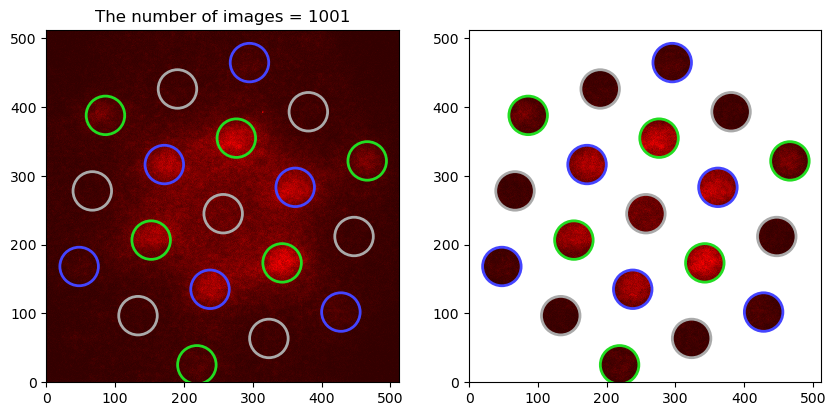

In [1518]:
vmin = 0
vmax = 3000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1519]:
def calculateVisibility(imgs, subROI_cx_list, subROI_cy_list, r):
    row, column = np.shape(imgs_trans[0])
    masks = np.zeros([3, row, column])
    ii, jj = np.meshgrid(np.arange(row), np.arange(column), indexing='ij')

    for n_ in range(0, len(momentum_peaks_C1_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[0] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[1] += d2 < r * r

    for n_ in range(len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list), len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list)+len(momentum_peaks_C3_dx_list), 1):
        d2 = np.square(ii - subROI_cy_list[n_]) + np.square(jj - subROI_cx_list[n_])
        masks[2] += d2 < r * r

    gamma_list = []
    k1_list = []
    k2_list = []
    visibilityOfChirality_list = []

    for img_ in imgs:
        Norm = np.sum(img_)
        gamma_list += [np.sum(img_ * masks[0])/Norm]
        k1_list += [np.sum(img_ * masks[1])/Norm]
        k2_list += [np.sum(img_ * masks[2])/Norm]

        visibilityOfChirality_list.append(np.abs(k1_list[-1]-k2_list[-1])/(k2_list[-1]+k1_list[-1]))
    x_list = np.arange(0,len(gamma_list),1)

    return x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

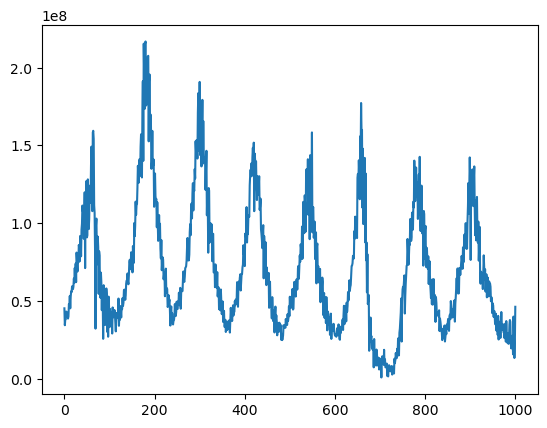

In [1520]:
flcount = scan_data['Total count @ ROI1 (arb. u.)']
plt.plot(flcount)

In [1521]:
threshold = 0.2e8
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j] and flcount[j]>threshold:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

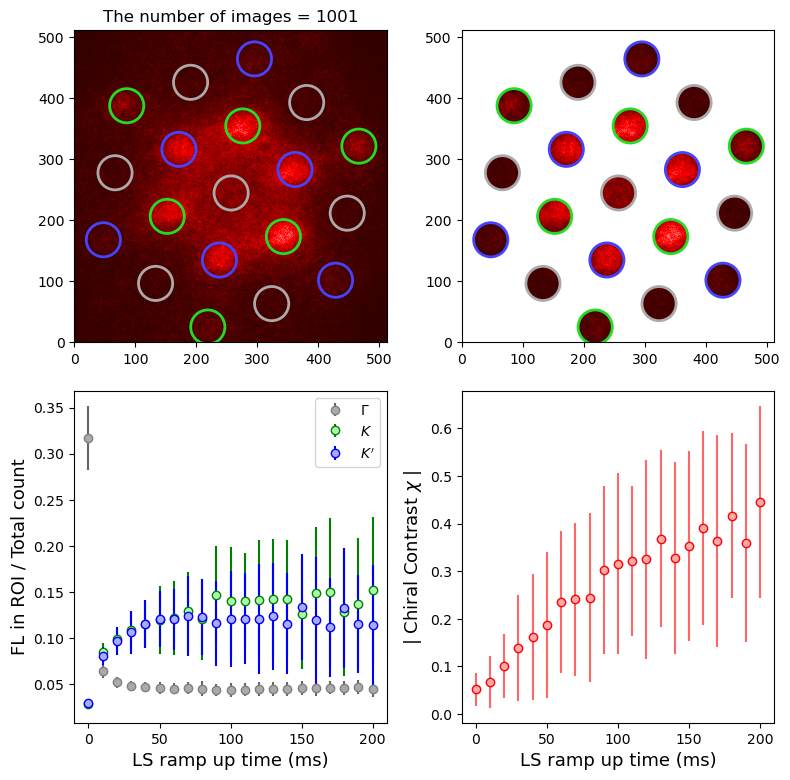

In [1522]:
vmin = 0
vmax = 2000
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=13)

plt.tight_layout()

In [1523]:
abs_chiral_contrast_list_spiral1 = []
sd_abs_chiral_contrast_list_spiral1 = []
fit_result_contrast_spiral1 = []

abs_chiral_contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_abs_chiral_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)
sampleImage_abs_chiral_contrast_spiral1 = img_trans_sample3

## 2023/02/01 Data003

In [1524]:
date = '20230201'
dataNo = 3
scanNo = 3
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]
param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 1
sample3 = 2
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

In [1525]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]

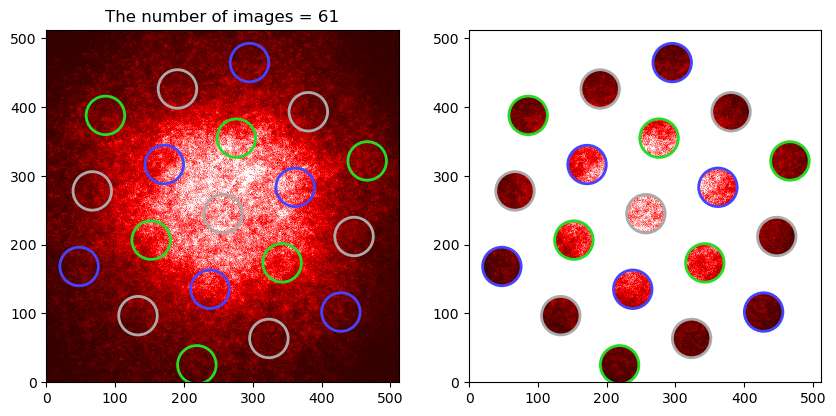

In [1526]:
vmin = 0
vmax = 3000
fig =plt.figure(figsize=[10,5],dpi = 100)
ax1 = fig.add_subplot(1,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(1,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

In [1527]:
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1528]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

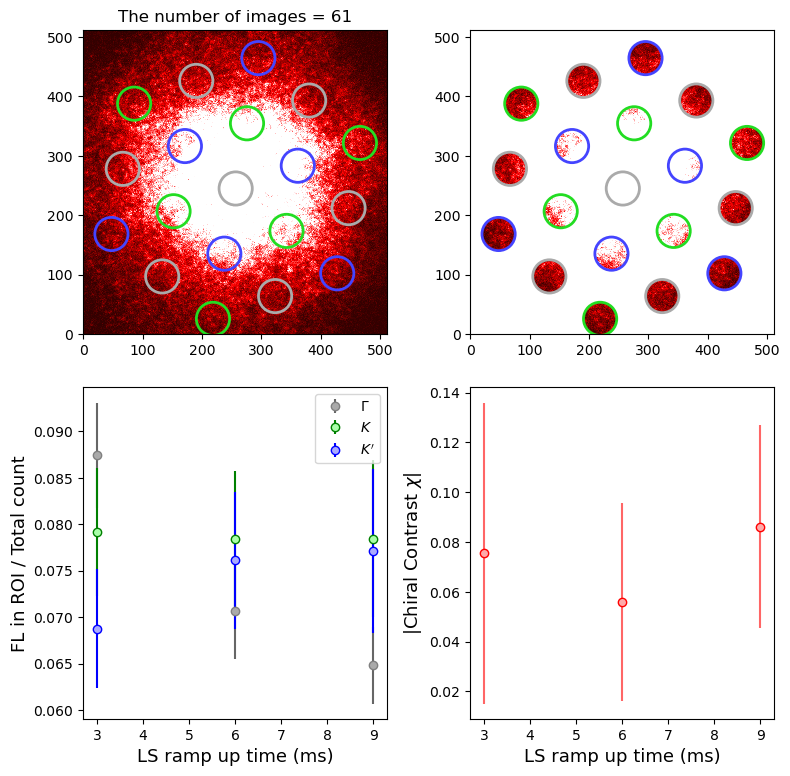

In [1529]:
vmin = 0
vmax = 1500
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'|Chiral Contrast $\chi$|', fontsize=13)

plt.tight_layout()

In [1530]:
abs_chiral_contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_abs_chiral_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)

# 2023/02/02 Data001

In [1531]:
date = '20230202'
dataNo = 1
scanNo = 1
path = r"./"+date
path_img = path + r"/data" + str('%03d' % dataNo) + "/raw"
path_scan = path + r"/scandir/Scan" + str('%03d' % scanNo) + '.txt'
path_param = path + r"/scandir/Parameters" + str('%03d' % scanNo) + '.txt'
scan_data = pd.read_csv(path_scan, delimiter='\t')
columns_sweep = []

for c in scan_data.columns:
    if ~np.all(scan_data[c] == scan_data[c][0]):
        if c[0] == 'T':
            columns_sweep += [c]

param_name = columns_sweep[1]
scan_param =scan_data[param_name]
unique_param = np.sort(scan_param.unique())

sample1 = 0
sample2 = 1
sample3 = 2
unit = '[ms]'
flcount = scan_data['Total count @ ROI1 (arb. u.)']

share = Path(path_img)
if share.exists():
    trans_files = list(Path(path_img).glob('seq*_trans.tiff'))
    flat_files = list(Path(path_img).glob('seq*_flat.tiff'))
    update_files = list(Path(path_img).glob('seq*_update.tiff'))
else:
    print('No images')

In [1532]:
imgs_flat =[]
imgs_trans = []

for N in range(len(trans_files)):
    imgs_flat += [np.array(Image.open(flat_files[N]))]
    imgs_trans += [np.array(Image.open(trans_files[N]))]

imgs_trans = np.array(imgs_trans)

img_flat_ave = np.average(imgs_flat, axis=0)
img_trans_ave =np.average(imgs_trans,axis=0) - img_flat_ave

for N in range(len(trans_files)):
    imgs_trans[N, :, :] = imgs_trans[N, :, :] - img_flat_ave

img_trans_sample1 = np.average(imgs_trans[scan_param == unique_param[sample1], :, :], axis=0)
img_trans_sample2 = np.average(imgs_trans[scan_param == unique_param[sample2], :, :], axis=0)
img_trans_sample3 = np.average(imgs_trans[scan_param == unique_param[sample3], :, :], axis=0)

In [1533]:
img_ave_by_unique_param = []

for p_ in unique_param:
    img_ave_by_unique_param += [np.average(imgs_trans[scan_param == p_, :, :], axis=0)]

In [1534]:
x_list, visibilityOfChirality_list, gamma_list, k1_list, k2_list = calculateVisibility(imgs_trans, subROI_cx_list, subROI_cy_list, r)

In [1535]:
gamma_list_by_unique_param = []
k1_list_by_unique_param = []
k2_list_by_unique_param = []
abs_contrast_list_by_unique_param =[]
flcount_by_unique_param = []
sd_gamma_list_by_unique_param = []
sd_k1_list_by_unique_param = []
sd_k2_list_by_unique_param = []
sd_abs_contrast_list_by_unique_param = []
sd_flcount_by_unique_param = []
for i in range(len(unique_param)):
    gamma_list_tmp = []
    k1_list_tmp = []
    k2_list_tmp = []
    abs_contrast_list = []
    flcount_tmp = []
    for j in range(len(trans_files)):
        if unique_param[i] == scan_param[j]:
            gamma_list_tmp.append(gamma_list[j])
            k1_list_tmp.append(k1_list[j])
            k2_list_tmp.append(k2_list[j])
            abs_contrast_list.append(visibilityOfChirality_list[j])
            flcount_tmp.append(flcount[j])
    gamma_list_by_unique_param.append(np.average(gamma_list_tmp))
    k1_list_by_unique_param.append(np.average(k1_list_tmp))
    k2_list_by_unique_param.append(np.average(k2_list_tmp))
    abs_contrast_list_by_unique_param.append(np.average(abs_contrast_list))
    flcount_by_unique_param.append(np.average(flcount_tmp))
    sd_gamma_list_by_unique_param.append(np.std(gamma_list_tmp,ddof=1))
    sd_k1_list_by_unique_param.append(np.std(k1_list_tmp,ddof=1))
    sd_k2_list_by_unique_param.append(np.std(k2_list_tmp,ddof=1))
    sd_abs_contrast_list_by_unique_param.append(np.std(abs_contrast_list,ddof=1))
    sd_flcount_by_unique_param.append(np.std(flcount_tmp,ddof=1))

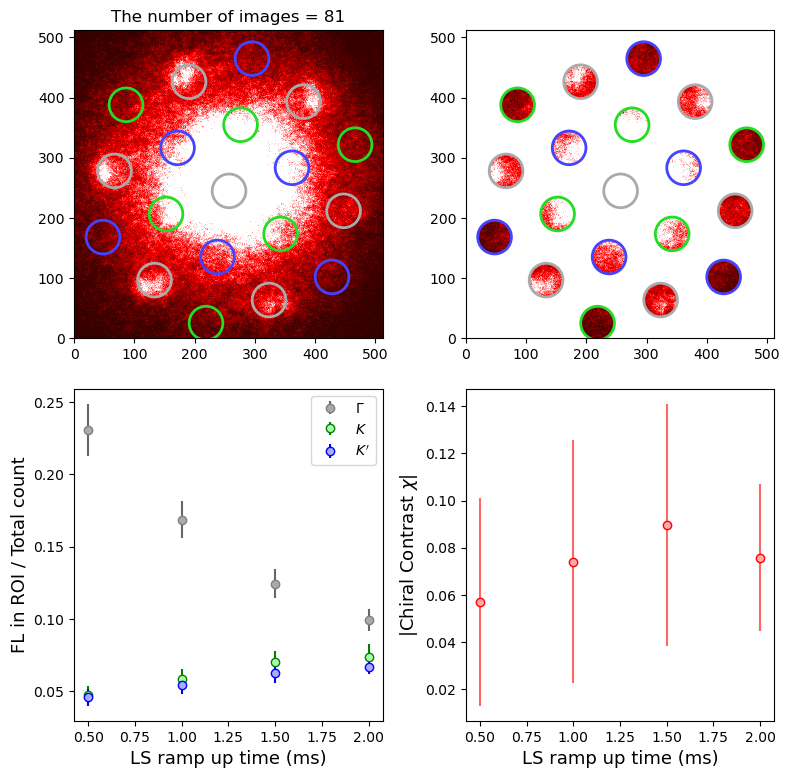

In [1536]:
vmin = 0
vmax = 1500
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(img_trans_sample3, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.set_title("The number of images = %d"%(len(imgs_trans)))

ax2 = fig.add_subplot(2,2,2)
for j in range(len(subROI_cx_list)):
    ax2.pcolormesh(extractCircleROI(img_trans_sample3, subROI_cx_list[j], subROI_cy_list[j], r), vmin=vmin, vmax=vmax, cmap=cmap, shading='auto')
ax2.set_aspect('equal')
ax2.set_xlim(xlim_1,xlim_2)
ax2.set_ylim(ylim_1,ylim_2)

for i in range(len(subROI_cx_list)):
    if i < len(momentum_peaks_C1_dx_list):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list)<=i<len(momentum_peaks_C1_dx_list)+len(momentum_peaks_C2_dx_list):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list[i], y=subROI_cy_list[i]), radius=r)
    region.plot(ax=ax1, color=color, lw=2, linestyle = '-')
    region.plot(ax=ax2, color=color, lw=2, linestyle = '-')

ax3 = fig.add_subplot(2,2,3)
ax3.errorbar(unique_param*1e-3, gamma_list_by_unique_param, sd_gamma_list_by_unique_param,fmt = 'o', c='#666666', mec='gray', mfc='#aaaaaa', label = r"$\Gamma$")
ax3.errorbar(unique_param*1e-3, k1_list_by_unique_param, sd_k1_list_by_unique_param,fmt = 'o', c='green', mec='green', mfc='#aaffaa', label = r"$K$")
ax3.errorbar(unique_param*1e-3, k2_list_by_unique_param, sd_k2_list_by_unique_param,fmt = 'o', c='blue', mec='blue', mfc='#aaaaff', label = r"$K'$")
ax3.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax3.set_ylabel(r'FL in ROI / Total count', fontsize=13)
# ax1.set_xlim(np.min(unique_param*1e-3), np.max(unique_param*1e-3))
ax3.legend()

ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param*1e-3, abs_contrast_list_by_unique_param, sd_abs_contrast_list_by_unique_param,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax4.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax4.set_ylabel(r'|Chiral Contrast $\chi$|', fontsize=13)

plt.tight_layout()

In [1537]:
abs_chiral_contrast_list_spiral1.append(abs_contrast_list_by_unique_param)
sd_abs_chiral_contrast_list_spiral1.append(sd_abs_contrast_list_by_unique_param)

In [1538]:
abs_chiral_contrast_list_spiral1 = np.array(list(itertools.chain.from_iterable(abs_chiral_contrast_list_spiral1)))
sd_abs_chiral_contrast_list_spiral1 = np.array(list(itertools.chain.from_iterable(sd_abs_chiral_contrast_list_spiral1)))

fitParameter_0=0.0020440986535543884(9.407337868513908e-05)
fitParameter_1=0.0633491487417376(0.003485910012097536)


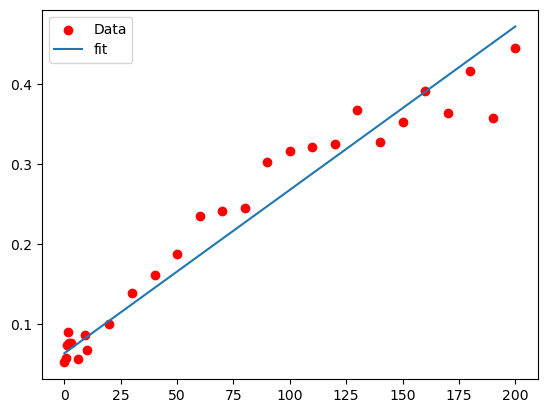

In [1539]:
x_list = unique_param_spiral1*1e-3
nx = np.array(abs_chiral_contrast_list_spiral1)
nx_err = np.array(sd_abs_chiral_contrast_list_spiral1)
# x_list = np.delete(unique_param_spiral1,slice(11,21,1))*1e-3
# nx = np.delete(np.array(abs_chiral_contrast_list_spiral1),slice(11,21,1))
# nx_err = np.delete(np.array(sd_abs_chiral_contrast_list_spiral1),slice(11,21,1))

# def cosine(x,*fit_param):
#     return fit_param[1]*np.cos(2*np.pi*fit_param[0]*x)+fit_param[2]
def fit_func(x,*fit_param):
    return fit_param[0]*x+fit_param[1]

def fit_result(fit_func, x_data_list, y_data_list, initial_param_list, yerr=nx_err):
    if (yerr is None):
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list)
    else:
        param, cov = scipy.optimize.curve_fit(fit_func, x_data_list, y_data_list, p0 = initial_param_list, sigma=yerr)
    perr = np.sqrt(np.diag(cov))
    x_fit_list = np.linspace(np.min(x_data_list),np.max(x_data_list),200)
    y_fit_list = []
    for num in x_fit_list:
        y_fit_list.append(fit_func(num, *param))
    return param, perr, x_fit_list, y_fit_list


para_ini =[40,np.max(x_list)]
fitResultsOfSampleImage_list = fit_result(fit_func, x_list, nx, para_ini)

for i in range(len(para_ini)):
    print("fitParameter_"+str(i)+"="+str(fitResultsOfSampleImage_list[0][i])+"("+str(fitResultsOfSampleImage_list[1][i])+")")

plt.scatter(x_list,nx, label='Data',c="r")
plt.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3],label="fit")
plt.legend()

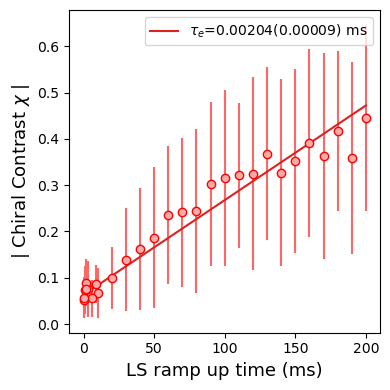

In [1540]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral1*1e-3, abs_chiral_contrast_list_spiral1, sd_abs_chiral_contrast_list_spiral1,fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax1.plot(fitResultsOfSampleImage_list[2],fitResultsOfSampleImage_list[3], c = '#dd2222',label=r"$\tau_e$=%.05f(%.05f) ms"%(fitResultsOfSampleImage_list[0][0], fitResultsOfSampleImage_list[1][0]))
ax1.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax1.set_ylabel(r'| Chiral Contrast $ \chi $ |', fontsize=13)
ax1.legend()
plt.tight_layout()

In [1541]:
fitResults_abs_chiral_contrast_spiral1 = fitResultsOfSampleImage_list

r_abs_chiral_contrast_spiral1 = r
subROI_cx_list_abs_chiral_contrast_spiral1 = subROI_cx_list
subROI_cy_list_abs_chiral_contrast_spiral1 = subROI_cy_list
momentum_peaks_C3_dx_list_abs_chiral_contrast_spiral1 = momentum_peaks_C3_dx_list
momentum_peaks_C2_dx_list_abs_chiral_contrast_spiral1 = momentum_peaks_C2_dx_list 
momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral1 = momentum_peaks_C1_dx_list

# Summary of Spiral 1

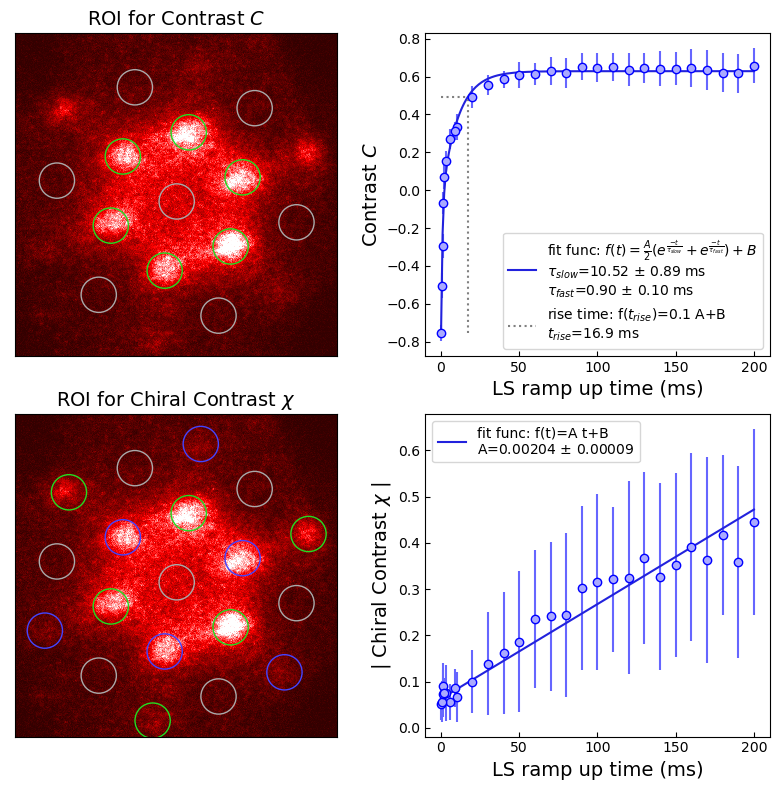

In [1542]:
vmin = 0
vmax = 1000
fig =plt.figure(figsize=[8,8],dpi = 100)
ax1 = fig.add_subplot(2,2,1)
mappable =ax1.pcolormesh(sampleImage_contrast_spiral1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax1.set_aspect('equal')
ax1.set_xlim(xlim_1,xlim_2)
ax1.set_ylim(ylim_1,ylim_2)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title(r"ROI for Contrast $C$", fontsize=14)
for i in range(len(subROI_cx_list_contrast_spiral1)):
    if i < len(momentum_peaks_C1_dx_list_contrast_spiral1):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list_contrast_spiral1)<=i<len(momentum_peaks_C1_dx_list_contrast_spiral1)+len(momentum_peaks_C2_dx_list_contrast_spiral1):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list_contrast_spiral1[i], y=subROI_cy_list_contrast_spiral1[i]), radius=r_contrast_spiral1)
    region.plot(ax=ax1, color=color, lw=1, linestyle = '-')

label=r'fit func: $f(t)=\frac{A}{2} (e^{\frac{-t}{\tau_{slow}}}+e^{\frac{-t}{\tau_{fast}}})+B$'+"\n"+r"$\tau_{slow}$=%.02f $\pm$ %.02f ms"%(fitResults_contrast_spiral1[0][0], fitResults_contrast_spiral1[1][0])+"\n"+r"$\tau_{fast}$=%.02f $\pm$ %.02f ms"%(fitResults_contrast_spiral1[0][3], fitResults_contrast_spiral1[1][3])
label_2 = r'rise time: f($t_{rise}$)=0.1 A+B'+'\n'+r'$t_{rise}$=%.01f ms'%(rise_time_spiral1)
ax2 = fig.add_subplot(2,2,2)
ax2.errorbar(unique_param_spiral1*1e-3, contrast_list_spiral1, sd_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax2.plot(fitResults_contrast_spiral1[2],fitResults_contrast_spiral1[3], c = '#2222dd',label=label)
ax2.vlines(x=rise_time_spiral1,ymin=np.min(contrast_list_spiral1),ymax=contrast_at_rise_time_spiral1,linestyles=':',colors='gray',label=label_2)
ax2.hlines(y=contrast_at_rise_time_spiral1, xmin=0,xmax=rise_time_spiral1,linestyles=':',colors='gray')
ax2.set_xlabel('LS ramp up time (ms)', fontsize=14)
ax2.set_ylabel(r'Contrast $C$', fontsize=14)
ax2.tick_params(axis='both',direction='in')
ax2.legend(loc='lower right')

ax3 = fig.add_subplot(2,2,3)
mappable =ax3.pcolormesh(sampleImage_abs_chiral_contrast_spiral1, cmap=cmap,vmin=vmin, vmax=vmax, shading='auto')
ax3.set_aspect('equal')
ax3.set_xlim(xlim_1,xlim_2)
ax3.set_ylim(ylim_1,ylim_2)
ax3.xaxis.set_visible(False)
ax3.yaxis.set_visible(False)
ax3.set_title(r"ROI for Chiral Contrast $\chi$", fontsize=14)
for i in range(len(subROI_cx_list_abs_chiral_contrast_spiral1)):
    if i < len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral1):
        color = '#aaaaaa'
    elif len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral1)<=i<len(momentum_peaks_C1_dx_list_abs_chiral_contrast_spiral1)+len(momentum_peaks_C2_dx_list_abs_chiral_contrast_spiral1):
        color = '#22dd22'
    else:
        color = '#4444ff'
    region = CirclePixelRegion(center=PixCoord(x=subROI_cx_list_abs_chiral_contrast_spiral1[i], y=subROI_cy_list_abs_chiral_contrast_spiral1[i]), radius=r_abs_chiral_contrast_spiral1)
    region.plot(ax=ax3, color=color, lw=1, linestyle = '-')

label=r'fit func: f(t)=A t+B'
ax4 = fig.add_subplot(2,2,4)
ax4.errorbar(unique_param_spiral1*1e-3, abs_chiral_contrast_list_spiral1, sd_abs_chiral_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax4.plot(fitResults_abs_chiral_contrast_spiral1[2],fitResults_abs_chiral_contrast_spiral1[3], c = '#2222dd',label=label+'\n'+r"A=%.05f $\pm$ %.05f"%(fitResults_abs_chiral_contrast_spiral1[0][0], fitResults_abs_chiral_contrast_spiral1[1][0]))
ax4.set_xlabel('LS ramp up time (ms)', fontsize=14)
ax4.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=14)
ax4.tick_params(axis='both',direction='in')
ax4.legend(loc='upper left')

plt.tight_layout()

# Comparison of Chiral Contrast between Spiral1 and Spiral 2

(0.0, 0.4)

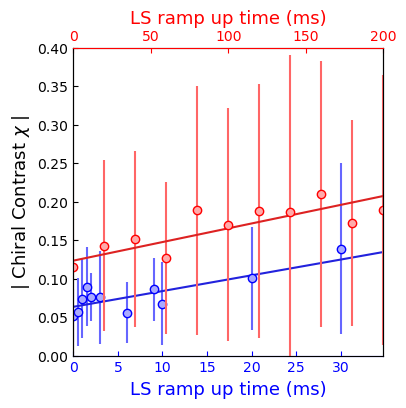

In [1543]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral1*1e-3, abs_chiral_contrast_list_spiral1, sd_abs_chiral_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax1.plot(fitResults_abs_chiral_contrast_spiral1[2],fitResults_abs_chiral_contrast_spiral1[3], c = '#2222dd',label=label+'\n'+r"A=%.05f $\pm$ %.05f"%(fitResults_abs_chiral_contrast_spiral1[0][0], fitResults_abs_chiral_contrast_spiral1[1][0]))
ax1.tick_params(axis='y',direction='in')
ax1.tick_params(axis='x',direction='in',colors='blue')
ax1.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax1.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=13)
ax1.set_xlim(0,200*rise_time_spiral1/rise_time_spiral2)
ax1.spines['bottom'].set_color('blue')
ax1.xaxis.label.set_color("blue")
ax1.set_ylim(0,0.4)

ax2 = ax1.twiny()
ax2.errorbar(unique_param_spiral2*1e-3, abs_chiral_contrast_list_spiral2[0], sd_abs_chiral_contrast_list_spiral2[0],fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax2.plot(fitResults_abs_chiral_contrast_spiral2[2],fitResults_abs_chiral_contrast_spiral2[3], c = '#dd2222',label=label+'\n'+r"A=%.05f $\pm$ %.05f"%(fitResults_abs_chiral_contrast_spiral2[0][0], fitResults_abs_chiral_contrast_spiral2[1][0]))
ax2.set_xlim(0,200)
ax2.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax2.spines['top'].set_color('red')

ax2.xaxis.label.set_color("red")
ax2.tick_params(axis='x',direction='in',colors='red')
ax2.set_ylim(0,0.4)

In [1544]:
x_list_fit_abs_chiral_contrast_spiral2 = np.linspace(300,300*rise_time_spiral2/rise_time_spiral1)
y_list_fit_abs_chiral_contrast_spiral2 = fitResults_abs_chiral_contrast_spiral2[0][0]*x_list_fit_abs_chiral_contrast_spiral2+fitResults_abs_chiral_contrast_spiral2[0][1]

In [1545]:
x_list_fit_abs_chiral_contrast_spiral1 = np.linspace(100,200)
y_list_fit_abs_chiral_contrast_spiral1 = fitResults_abs_chiral_contrast_spiral1[0][0]*x_list_fit_abs_chiral_contrast_spiral1+fitResults_abs_chiral_contrast_spiral1[0][1]

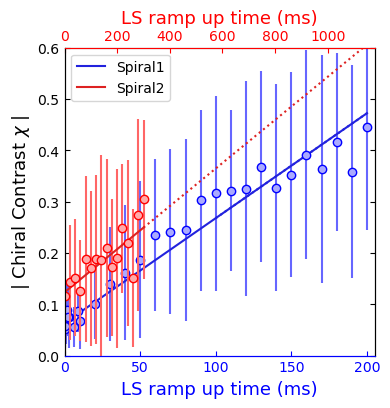

In [1546]:
fig =plt.figure(figsize=[4,4],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral1*1e-3, abs_chiral_contrast_list_spiral1, sd_abs_chiral_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax1.plot(fitResults_abs_chiral_contrast_spiral1[2],fitResults_abs_chiral_contrast_spiral1[3], c = '#2222dd',label="Spiral1")
ax1.plot(x_list_fit_abs_chiral_contrast_spiral1,y_list_fit_abs_chiral_contrast_spiral1, c = '#2222dd',linestyle=':')
ax1.tick_params(axis='y',right=True,direction='in')
ax1.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax1.set_ylabel(r'| Chiral Contrast $\chi$ |', fontsize=13)
ax1.set_xlim(0,205)
ax1.spines['bottom'].set_color('blue')
ax1.xaxis.label.set_color("blue")
ax1.tick_params(axis='x',direction='in',colors='blue')
ax1.set_ylim(0,0.6)

ax2 = ax1.twiny()
ax2.errorbar(unique_param_spiral2*1e-3, abs_chiral_contrast_list_spiral2[0], sd_abs_chiral_contrast_list_spiral2[0],fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax2.plot(fitResults_abs_chiral_contrast_spiral2[2],fitResults_abs_chiral_contrast_spiral2[3],  c = '#dd2222',label="Spiral2")
ax2.plot(x_list_fit_abs_chiral_contrast_spiral2,y_list_fit_abs_chiral_contrast_spiral2, c = '#dd2222', linestyle=':')
ax2.set_xlim(0,205*rise_time_spiral2/rise_time_spiral1)
ax2.set_xlabel('LS ramp up time (ms)', fontsize=13)
ax2.spines['top'].set_color('red')
ax2.spines['bottom'].set_color('blue')
ax2.xaxis.label.set_color("red")
ax2.tick_params(axis='x',direction='in',colors='red')
ax2.set_ylim(0,0.6)
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()

ax2.legend(h1 + h2, l1 + l2, loc='upper left')

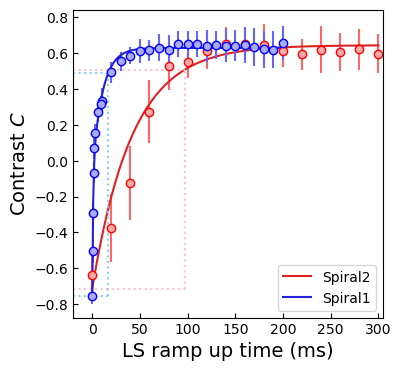

In [1547]:
xmin_contrast = -20
fig =plt.figure(figsize=[4,4],dpi = 100)
label=r'fit func: $f(t)=A e^{\frac{-t}{\tau}}+B$'+"\n"+r"$\tau$=%.01f $\pm$ %.01f ms"%(fitResults_contrast_spiral2[0][0], fitResults_contrast_spiral2[1][0])
label_2 = r'rise time: f($t_{rise}$)=0.1 A+B'+'\n'+r'$t_{rise}$=%.01f ms'%(rise_time_spiral2)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral2*1e-3, contrast_list_spiral2[0], sd_contrast_list_spiral2[0],fmt = 'o', c='#ff6666', mec='r', mfc='#ffaaaa')
ax1.plot(fitResults_contrast_spiral2[2],fitResults_contrast_spiral2[3], c = '#dd2222',label="Spiral2")
ax1.vlines(x=rise_time_spiral2,ymin=np.min(fitResults_contrast_spiral2[3]),ymax=contrast_at_rise_time_spiral2,linestyles=':',colors='pink')
ax1.hlines(y=contrast_at_rise_time_spiral2, xmin=xmin_contrast,xmax=rise_time_spiral2,linestyles=':',colors='pink')
ax1.hlines(y=np.min(fitResults_contrast_spiral2[3]), xmin=xmin_contrast,xmax=rise_time_spiral2,linestyles=':',colors='pink')
ax1.errorbar(unique_param_spiral1*1e-3, contrast_list_spiral1, sd_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax1.plot(fitResults_contrast_spiral1[2],fitResults_contrast_spiral1[3], c = '#2222dd',label="Spiral1")
ax1.vlines(x=rise_time_spiral1,ymin=np.min(fitResults_contrast_spiral1[3]),ymax=contrast_at_rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.hlines(y=contrast_at_rise_time_spiral1, xmin=xmin_contrast,xmax=rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.hlines(y=np.min(fitResults_contrast_spiral1[3]), xmin=xmin_contrast,xmax=rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.set_xlim(-20,305)
ax1.set_xlabel('LS ramp up time (ms)', fontsize=14)
ax1.set_ylabel(r'Contrast $C$', fontsize=14)
ax1.tick_params(axis='both',direction='in')
ax1.legend()
# ax1.legend(loc='lower right')



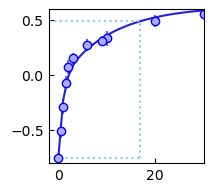

In [1548]:
fig =plt.figure(figsize=[2,2],dpi = 100)
ax1 = fig.add_subplot(1,1,1)
ax1.errorbar(unique_param_spiral1*1e-3, contrast_list_spiral1, sd_contrast_list_spiral1,fmt = 'o', c='#6666ff', mec='b', mfc='#aaaaff')
ax1.plot(fitResults_contrast_spiral1[2],fitResults_contrast_spiral1[3], c = '#2222dd',label="Spiral1")
ax1.vlines(x=rise_time_spiral1,ymin=np.min(fitResults_contrast_spiral1[3]),ymax=contrast_at_rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.hlines(y=contrast_at_rise_time_spiral1, xmin=xmin_contrast,xmax=rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.hlines(y=np.min(fitResults_contrast_spiral1[3]), xmin=xmin_contrast,xmax=rise_time_spiral1,linestyles=':',colors='skyblue')
ax1.set_ylim(-0.8,0.6)
ax1.set_xlim(-2,30)
ax1.tick_params(axis='both',direction='in')
